**Step 1  Setup and Initialization**

In [ ]:
# Install Ultralytics library
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 896.3/896.3 kB 12.1 MB/s eta 0:00:00


In [ ]:
# Disable warnings in the notebook to maintain clean output cells
import warnings
warnings.filterwarnings('ignore')

# Import necessary libraries
import os
import shutil
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import torch  # For checking GPU availability
import random
import cv2
import yaml
from PIL import Image
from collections import deque
from ultralytics import YOLO
from IPython.display import Video
import gcsfs  # For Google Cloud Storage access if needed

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [ ]:
# Configure the visual appearance of Seaborn plots
sns.set(rc={'axes.facecolor': '#ffe4de'}, style='darkgrid')

**Step 2 | Loading YOLOv8-seg Pre-trained Model**

In [ ]:
# Load the pre-trained YOLOv8 nano segmentation model
model = YOLO('yolov8s-seg.pt')

100%|██████████| 22.8M/22.8M [00:00<00:00, 356MB/s]


**Step 3 | Dataset Exploration**

In [ ]:
# Define the dataset_path
dataset_path = '/content/drive/MyDrive/Colab Notebooks/Pothole by Yash'   # path of folder

checkpoint_path = '/content/drive/MyDrive/checkpoints'  # Directory for saving checkpoints
# Set the path to the YAML file
yaml_file_path = os.path.join(dataset_path, 'data.yaml')

# Check if the YAML file exists
if os.path.exists(yaml_file_path):
    # Load and print the contents of the YAML file
    with open(yaml_file_path, 'r') as file:
        yaml_content = yaml.load(file, Loader=yaml.FullLoader)
        print("Contents of the YAML file:")
        print(yaml.dump(yaml_content, default_flow_style=False))
else:
    print(f"YAML file not found at: {yaml_file_path}")

Contents of the YAML file:
names:
- Pothole
nc: 1
roboflow:
  license: CC BY 4.0
  project: pothole_segmentation_yolov8
  url: https://universe.roboflow.com/farzad/pothole_segmentation_yolov8/dataset/1
  version: 1
  workspace: farzad
train: ../train/images
val: ../valid/images



In [ ]:
# Set paths for training and validation image sets
train_images_path = os.path.join(dataset_path, 'train', 'images')
valid_images_path = os.path.join(dataset_path, 'valid', 'images')

# Initialize counters for the number of images
num_train_images = 0
num_valid_images = 0

# Initialize sets to hold the unique sizes of images
train_image_sizes = set()
valid_image_sizes = set()

# Define the target size for resizing
target_size = (640, 640)

# Function to resize and check image sizes
def process_and_resize_images(image_dir, target_size):
    image_count = 0
    image_sizes = set()
    for filename in os.listdir(image_dir):
        if filename.lower().endswith(('.jpg', '.jpeg', '.png')):  # Handle multiple formats
            image_count += 1
            image_path = os.path.join(image_dir, filename)
            try:
                with Image.open(image_path) as img:
                    # Resize the image
                    img_resized = img.resize(target_size)
                    img_resized.save(image_path)  # Overwrite the original image (or save as new if needed)
                    image_sizes.add(img_resized.size)  # Track the size after resizing
            except Exception as e:
                print(f"Error loading or resizing image {filename}: {e}")
    return image_count, image_sizes

# Process and resize training and validation images
num_train_images, train_image_sizes = process_and_resize_images(train_images_path, target_size)
num_valid_images, valid_image_sizes = process_and_resize_images(valid_images_path, target_size)

# Print the results
print(f"Number of training images: {num_train_images}")
print(f"Number of validation images: {num_valid_images}")

# Check if all images in training set have the same size after resizing
if len(train_image_sizes) == 1:
    print(f"All training images have the same size: {train_image_sizes.pop()}")
else:
    print(f"Training images have varying sizes: {train_image_sizes}")

# Check if all images in validation set have the same size after resizing
if len(valid_image_sizes) == 1:
    print(f"All validation images have the same size: {valid_image_sizes.pop()}")
else:
    print(f"Validation images have varying sizes: {valid_image_sizes}")


Number of training images: 720
Number of validation images: 60
All training images have the same size: (640, 640)
All validation images have the same size: (640, 640)


100%|██████████| 15/15 [00:00<00:00, 49.02it/s]


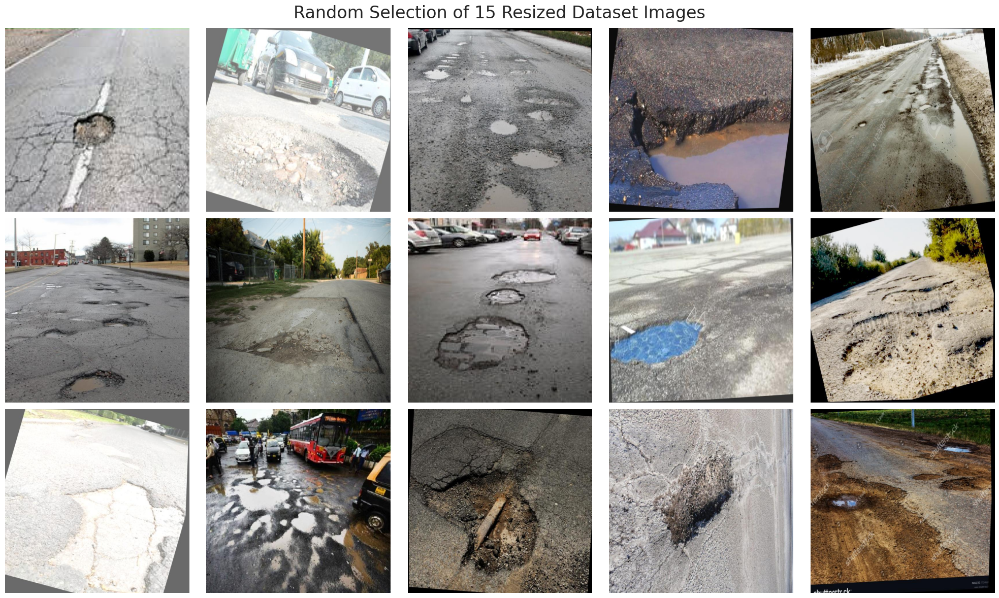

In [ ]:
from tqdm import tqdm

# Set the seed for the random number generator
random.seed(0)

# Create a list of image files (supporting multiple formats)
image_files = [f for f in os.listdir(train_images_path) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

# Randomly select 15 images
random_images = random.sample(image_files, 15)

# Create a new figure (adjusting figure size dynamically)
rows = 3
cols = (len(random_images) + rows - 1) // rows  # Calculate columns based on number of images
plt.figure(figsize=(cols * 4, rows * 4))

# Loop through each image and display it in a dynamic grid
for i, image_file in tqdm(enumerate(random_images), total=len(random_images)):
    image_path = os.path.join(train_images_path, image_file)

    # Load and display the resized image (images are already resized in the first cell)
    try:
        image = Image.open(image_path)
    except Exception as e:
        print(f"Error loading image {image_file}: {e}")
        continue  # Skip the problematic image

    # Add image to subplot
    plt.subplot(rows, cols, i + 1)
    plt.imshow(image)
    plt.axis('off')  # Hide axis

# Add a suptitle
plt.suptitle(f'Random Selection of {len(random_images)} Resized Dataset Images', fontsize=24)

# Show the plot
plt.tight_layout()
plt.show()


**Step 4 | Fine-Tuning YOLOv8-seg**

In [ ]:
# Ensure the checkpoint directory exists
checkpoint_path = '/content/drive/MyDrive/pothole_model/checkpoints'
os.makedirs(checkpoint_path, exist_ok=True)

# Function to train the model with checkpoints and automatic mixed precision
def train_with_checkpoints(model, yaml_file, checkpoint_dir, epochs=150, batch_size=16, resume_from_epoch=None):
    start_epoch = resume_from_epoch if resume_from_epoch is not None else 0
    device = 'cuda' if torch.cuda.is_available() else 'cpu'

    # Run training
    results = model.train(
        data=yaml_file,
        epochs=epochs,
        imgsz=640,
        patience=15,  # Early stopping to prevent overfitting
        batch=batch_size,
        optimizer='adam',  # More stable optimizer
        lr0=0.0005,  # Adjusted learning rate
        lrf=0.01,  # Learning rate range factor
        dropout=0.5,  # Increased dropout to help with regularization
        device=device,
        seed=42,
        amp=True,  # Enable automatic mixed precision
        val=True,  # Include validation
        project='/content/drive/MyDrive/pothole_model/logs',
        name='pothole_segmentation_training',
        exist_ok=True,  # Continue logs if interrupted
        augment=True,  # Enable data augmentation
        mixup=0.1,  # Mixup augmentation to improve generalization
        mosaic=True  # Mosaic augmentation to improve robustness
    )

    # Save checkpoints periodically (every 10 epochs)
    for epoch in range(start_epoch, epochs, 10):
        checkpoint_filename = f'checkpoint_epoch_{epoch}.pt'
        model.save(os.path.join(checkpoint_dir, checkpoint_filename))
        print(f'Saved checkpoint at epoch {epoch} to {checkpoint_filename}')

    # Save the final model weights
    model.save(os.path.join(checkpoint_dir, 'best.pt'))
    print('Training complete. Final model saved as best.pt')


# Start training
yaml_file_path = '/content/drive/MyDrive/Colab Notebooks/Pothole by Yash/data.yaml'  # Replace with your actual data.yaml path
train_with_checkpoints(model, yaml_file_path, checkpoint_path, epochs=150, batch_size=16)

# ---- Code for Resuming Training ----

# Find the latest checkpoint
checkpoints = sorted(
    [f for f in os.listdir(checkpoint_path) if f.startswith('checkpoint_epoch_')],
    key=lambda x: int(x.split('_')[-1].split('.')[0])
)

# If there are checkpoints, load the latest one
if checkpoints:
    latest_checkpoint = os.path.join(checkpoint_path, checkpoints[-1])
    latest_epoch = int(checkpoints[-1].split('_')[-1].split('.')[0]) + 10
    if os.path.exists(latest_checkpoint):
        model.load(latest_checkpoint)
        print(f'Resuming training from checkpoint: {latest_checkpoint}')
    else:
        print(f"Checkpoint {latest_checkpoint} not found. Starting from scratch.")
        latest_epoch = 0
else:
    latest_epoch = 0  # No checkpoint, start from scratch

# Resume training from the last saved checkpoint
train_with_checkpoints(model, yaml_file_path, checkpoint_path, epochs=150, batch_size=16, resume_from_epoch=latest_epoch)


Ultralytics 8.3.36 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=segment, mode=train, model=yolov8n-seg.pt, data=/content/drive/MyDrive/Colab Notebooks/Pothole by Yash/data.yaml, epochs=150, time=None, patience=15, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=cuda, workers=8, project=/content/drive/MyDrive/pothole_model/logs, name=pothole_segmentation_training, exist_ok=True, pretrained=True, optimizer=adam, verbose=True, seed=42, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.5, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=True, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frame

100%|██████████| 755k/755k [00:00<00:00, 100MB/s]


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 354MB/s]


AMP: checks passed ✅


train: Scanning /content/drive/MyDrive/Colab Notebooks/Pothole by Yash/train/labels... 720 images, 0 backgrounds, 0 corrupt: 100%|██████████| 720/720 [10:19<00:00,  1.16it/s]


train: New cache created: /content/drive/MyDrive/Colab Notebooks/Pothole by Yash/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/drive/MyDrive/Colab Notebooks/Pothole by Yash/valid/labels... 60 images, 0 backgrounds, 0 corrupt: 100%|██████████| 60/60 [00:49<00:00,  1.20it/s]

val: New cache created: /content/drive/MyDrive/Colab Notebooks/Pothole by Yash/valid/labels.cache


Plotting labels to /content/drive/MyDrive/pothole_model/logs/pothole_segmentation_training/labels.jpg... 
optimizer: Adam(lr=0.0005, momentum=0.937) with parameter groups 66 weight(decay=0.0), 77 weight(decay=0.0005), 76 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to /content/drive/MyDrive/pothole_model/logs/pothole_segmentation_training
Starting training for 150 epochs...

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      1/150      2.88G      1.567      3.152      2.344      1.486        102        640: 100%|██████████| 45/45 [00:27<00:00,  1.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.05it/s]

                   all         60        201      0.713     0.0371      0.139      0.064      0.417     0.0214     0.0431    0.00972



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      2/150      2.81G      1.447      2.612      1.682       1.39         74        640: 100%|██████████| 45/45 [00:25<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.06it/s]

                   all         60        201      0.414      0.328      0.345      0.192      0.413      0.214      0.193     0.0678



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      3/150      2.83G      1.433      2.511       1.59      1.394         68        640: 100%|██████████| 45/45 [00:22<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.49it/s]

                   all         60        201      0.461      0.408      0.416      0.226       0.43      0.408      0.402      0.185



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      4/150      2.82G      1.412      2.429      1.505      1.381        108        640: 100%|██████████| 45/45 [00:25<00:00,  1.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.10it/s]

                   all         60        201      0.576      0.557      0.582      0.326      0.565      0.547      0.575      0.316



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      5/150      2.84G      1.388      2.428      1.437      1.364         86        640: 100%|██████████| 45/45 [00:24<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.23it/s]

                   all         60        201      0.622      0.552      0.561       0.31      0.606      0.532       0.54      0.259



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      6/150      2.87G       1.33      2.264      1.368      1.309         87        640: 100%|██████████| 45/45 [00:22<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.68it/s]

                   all         60        201      0.632      0.606      0.619      0.336      0.632      0.606      0.614      0.302



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      7/150      2.78G      1.369      2.348      1.378      1.346         87        640: 100%|██████████| 45/45 [00:22<00:00,  1.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.18s/it]

                   all         60        201      0.625      0.605      0.636      0.357      0.625      0.606      0.621      0.339



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      8/150      2.84G      1.315      2.252      1.301      1.302         77        640: 100%|██████████| 45/45 [00:25<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.53it/s]

                   all         60        201      0.678      0.587      0.632      0.364      0.675      0.597       0.64      0.335



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      9/150      2.82G       1.27      2.202       1.24      1.293         78        640: 100%|██████████| 45/45 [00:23<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.66it/s]

                   all         60        201      0.655      0.622      0.648      0.377       0.68      0.627      0.653      0.346



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     10/150       2.8G      1.303      2.229       1.25      1.306         97        640: 100%|██████████| 45/45 [00:24<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.27s/it]

                   all         60        201      0.681      0.572      0.659      0.374      0.675      0.582      0.664      0.368



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     11/150      2.85G      1.244      2.139      1.174      1.272        105        640: 100%|██████████| 45/45 [00:22<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.19it/s]

                   all         60        201      0.711      0.638      0.676      0.407      0.729      0.656        0.7      0.406



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     12/150       2.8G      1.248       2.13      1.205      1.272         88        640: 100%|██████████| 45/45 [00:24<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.03s/it]

                   all         60        201      0.699      0.567      0.625      0.355      0.692      0.562      0.617      0.347



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     13/150      2.77G      1.253      2.129      1.148      1.275         93        640: 100%|██████████| 45/45 [00:25<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.51it/s]

                   all         60        201      0.786      0.584      0.723      0.411      0.793      0.589      0.721      0.407



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     14/150      2.74G      1.226      2.085      1.106      1.253         62        640: 100%|██████████| 45/45 [00:23<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]

                   all         60        201       0.62      0.699      0.717      0.408      0.606      0.726      0.711      0.397



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     15/150      2.79G       1.24      2.097        1.1      1.259         75        640: 100%|██████████| 45/45 [00:27<00:00,  1.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.37s/it]

                   all         60        201      0.635      0.637      0.659      0.373      0.619      0.615      0.654      0.367



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     16/150      2.85G      1.237      2.123      1.115       1.26         90        640: 100%|██████████| 45/45 [00:23<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.30it/s]

                   all         60        201      0.595      0.706      0.679      0.393       0.63      0.679      0.693      0.382



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     17/150      2.81G      1.192      2.043      1.061      1.226         62        640: 100%|██████████| 45/45 [00:23<00:00,  1.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.25s/it]

                   all         60        201      0.666      0.644      0.677      0.406      0.698      0.662      0.723      0.393



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     18/150      2.83G      1.192       2.05      1.074      1.233         82        640: 100%|██████████| 45/45 [00:24<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.55it/s]

                   all         60        201      0.674      0.652      0.689      0.401      0.656      0.662      0.685      0.384



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     19/150      2.91G      1.199      2.062      1.052      1.226         64        640: 100%|██████████| 45/45 [00:22<00:00,  1.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.29it/s]

                   all         60        201      0.697      0.612      0.661      0.364      0.721      0.602      0.668      0.357



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     20/150      2.84G      1.174      2.014      1.021      1.223         58        640: 100%|██████████| 45/45 [00:23<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.28s/it]

                   all         60        201      0.619      0.648      0.644      0.366      0.631      0.657      0.654      0.356



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     21/150      2.89G      1.162      2.012      1.053       1.22         60        640: 100%|██████████| 45/45 [00:22<00:00,  2.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.28it/s]

                   all         60        201      0.644      0.602       0.65      0.364      0.645      0.637      0.662      0.366



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     22/150      2.87G      1.163      1.996      1.034      1.207         75        640: 100%|██████████| 45/45 [00:22<00:00,  1.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.13it/s]

                   all         60        201      0.676      0.642      0.685      0.369      0.676      0.642      0.681       0.36



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     23/150      2.97G       1.18      2.019      1.014      1.213         77        640: 100%|██████████| 45/45 [00:24<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.33s/it]

                   all         60        201      0.705      0.643      0.661       0.37      0.716      0.653      0.668      0.356



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     24/150      2.85G       1.15      1.982     0.9779      1.195         76        640: 100%|██████████| 45/45 [00:23<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.43it/s]

                   all         60        201      0.751      0.602       0.69      0.424      0.764      0.611      0.708      0.419



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     25/150      2.85G      1.132      1.967     0.9757      1.191         62        640: 100%|██████████| 45/45 [00:23<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.13s/it]

                   all         60        201      0.672      0.627      0.688      0.408      0.677      0.632      0.683      0.407



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     26/150      2.87G      1.155      1.968     0.9746      1.202         74        640: 100%|██████████| 45/45 [00:24<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.23it/s]

                   all         60        201      0.684      0.672      0.706      0.403      0.689      0.667      0.712      0.395



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     27/150      2.84G      1.143      1.999     0.9774      1.192         95        640: 100%|██████████| 45/45 [00:25<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.53it/s]

                   all         60        201      0.729      0.627      0.687      0.399      0.759      0.647      0.703      0.373



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     28/150      2.84G      1.115      1.903     0.9439      1.179        115        640: 100%|██████████| 45/45 [00:23<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.32s/it]

                   all         60        201      0.745      0.612      0.698      0.409       0.76      0.627      0.713      0.397



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     29/150      2.82G      1.121      1.922     0.9368      1.181         93        640: 100%|██████████| 45/45 [00:23<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.61it/s]

                   all         60        201      0.705      0.582      0.673       0.41      0.734      0.605      0.698      0.394



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     30/150      2.81G      1.108      1.928     0.9164      1.184         75        640: 100%|██████████| 45/45 [00:22<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.09it/s]

                   all         60        201      0.728      0.617      0.688       0.41      0.752      0.637      0.717      0.401



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     31/150      2.79G       1.11      1.944     0.9404       1.18         90        640: 100%|██████████| 45/45 [00:25<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.05it/s]

                   all         60        201      0.694      0.657      0.675      0.405      0.727      0.642      0.682      0.381



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     32/150      2.82G      1.105      1.921     0.9544      1.176         85        640: 100%|██████████| 45/45 [00:23<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.31it/s]

                   all         60        201      0.638      0.605      0.613      0.362      0.689      0.562      0.625       0.33



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     33/150      2.83G      1.121      1.983     0.9645      1.195         49        640: 100%|██████████| 45/45 [00:23<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.17s/it]

                   all         60        201       0.73      0.587      0.687      0.404      0.748      0.602      0.708      0.389



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     34/150      2.79G      1.105      1.949     0.9137      1.186         80        640: 100%|██████████| 45/45 [00:24<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.44it/s]

                   all         60        201      0.673      0.567      0.651      0.393      0.685      0.577      0.654      0.369



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     35/150      2.83G      1.071      1.864     0.8942      1.166         95        640: 100%|██████████| 45/45 [00:23<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.25it/s]

                   all         60        201      0.699      0.617      0.681      0.402      0.711      0.627        0.7      0.392



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     36/150      2.79G      1.049      1.839     0.8677       1.14         62        640: 100%|██████████| 45/45 [00:24<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.29s/it]

                   all         60        201      0.718      0.627      0.703       0.41      0.738      0.642      0.712      0.393



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     37/150      2.86G      1.103      1.934      0.901      1.181         78        640: 100%|██████████| 45/45 [00:23<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.57it/s]

                   all         60        201      0.662        0.7      0.691      0.404      0.684      0.678      0.694      0.392



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     38/150      2.89G      1.057      1.809     0.8533      1.146         79        640: 100%|██████████| 45/45 [00:22<00:00,  1.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.15it/s]

                   all         60        201      0.686      0.631      0.694      0.411      0.686      0.631      0.682      0.397



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     39/150      2.79G      1.061      1.862     0.8854      1.163        110        640: 100%|██████████| 45/45 [00:28<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.24s/it]

                   all         60        201      0.652      0.644      0.675      0.419      0.662      0.653      0.685      0.398
EarlyStopping: Training stopped early as no improvement observed in last 15 epochs. Best results observed at epoch 24, best model saved as best.pt.
To update EarlyStopping(patience=15) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.



39 epochs completed in 0.296 hours.
Optimizer stripped from /content/drive/MyDrive/pothole_model/logs/pothole_segmentation_training/weights/last.pt, 6.8MB
Optimizer stripped from /content/drive/MyDrive/pothole_model/logs/pothole_segmentation_training/weights/best.pt, 6.8MB

Validating /content/drive/MyDrive/pothole_model/logs/pothole_segmentation_training/weights/best.pt...
Ultralytics 8.3.36 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8n-seg summary (fused): 195 layers, 3,258,259 parameters, 0 gradients, 12.0 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ Model does not support 'augment=True', reverting to single-scale prediction.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:00<00:00,  2.22it/s]

WARNING ⚠️ Model does not support 'augment=True', reverting to single-scale prediction.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.45it/s]


                   all         60        201      0.752      0.602      0.691      0.424      0.768      0.612      0.709      0.421
Speed: 0.2ms preprocess, 2.9ms inference, 0.0ms loss, 3.6ms postprocess per image
Results saved to /content/drive/MyDrive/pothole_model/logs/pothole_segmentation_training
Saved checkpoint at epoch 0 to checkpoint_epoch_0.pt
Saved checkpoint at epoch 10 to checkpoint_epoch_10.pt
Saved checkpoint at epoch 20 to checkpoint_epoch_20.pt
Saved checkpoint at epoch 30 to checkpoint_epoch_30.pt
Saved checkpoint at epoch 40 to checkpoint_epoch_40.pt
Saved checkpoint at epoch 50 to checkpoint_epoch_50.pt
Saved checkpoint at epoch 60 to checkpoint_epoch_60.pt
Saved checkpoint at epoch 70 to checkpoint_epoch_70.pt
Saved checkpoint at epoch 80 to checkpoint_epoch_80.pt
Saved checkpoint at epoch 90 to checkpoint_epoch_90.pt
Saved checkpoint at epoch 100 to checkpoint_epoch_100.pt
Saved checkpoint at epoch 110 to checkpoint_epoch_110.pt
Saved checkpoint at epoch 120 to c

train: Scanning /content/drive/MyDrive/Colab Notebooks/Pothole by Yash/train/labels.cache... 720 images, 0 backgrounds, 0 corrupt: 100%|██████████| 720/720 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/drive/MyDrive/Colab Notebooks/Pothole by Yash/valid/labels.cache... 60 images, 0 backgrounds, 0 corrupt: 100%|██████████| 60/60 [00:00<?, ?it/s]


Plotting labels to /content/drive/MyDrive/pothole_model/logs/pothole_segmentation_training/labels.jpg... 
optimizer: Adam(lr=0.0005, momentum=0.937) with parameter groups 66 weight(decay=0.0), 77 weight(decay=0.0005), 76 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to /content/drive/MyDrive/pothole_model/logs/pothole_segmentation_training
Starting training for 150 epochs...

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      1/150      3.22G      1.183      2.099      1.027      1.226        102        640: 100%|██████████| 45/45 [00:29<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.46it/s]

                   all         60        201      0.683      0.443      0.511      0.291      0.473      0.313      0.288      0.113



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      2/150      2.81G      1.147      2.049      1.006      1.205         74        640: 100%|██████████| 45/45 [00:23<00:00,  1.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.59it/s]

                   all         60        201       0.72      0.502      0.592      0.346      0.716      0.514      0.596      0.317



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      3/150      2.83G       1.16      2.008      1.024      1.219         68        640: 100%|██████████| 45/45 [00:24<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.33it/s]

                   all         60        201      0.695      0.622      0.653      0.362      0.689      0.617      0.653      0.335



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      4/150      2.84G      1.156      1.987      1.024      1.223        108        640: 100%|██████████| 45/45 [00:26<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.27s/it]

                   all         60        201      0.674      0.649      0.677       0.39      0.754      0.597       0.68      0.375



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      5/150      2.83G      1.148      2.036      0.991      1.219         86        640: 100%|██████████| 45/45 [00:24<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.28it/s]

                   all         60        201      0.608      0.677      0.639      0.359      0.621      0.683      0.647      0.348



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      6/150      2.88G      1.107      1.894     0.9465      1.178         87        640: 100%|██████████| 45/45 [00:23<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.83it/s]

                   all         60        201      0.693      0.662      0.692      0.386      0.695      0.662       0.69      0.383



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      7/150      2.78G      1.162      1.991       1.02       1.21         87        640: 100%|██████████| 45/45 [00:25<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.37s/it]

                   all         60        201      0.676      0.562      0.653       0.39      0.682      0.552      0.644      0.368



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      8/150      2.85G      1.114       1.92     0.9596      1.191         77        640: 100%|██████████| 45/45 [00:25<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.63it/s]

                   all         60        201      0.583      0.667      0.659      0.381      0.681      0.587       0.67      0.355



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      9/150      2.84G      1.087      1.903     0.9244      1.179         78        640: 100%|██████████| 45/45 [00:27<00:00,  1.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.23it/s]

                   all         60        201      0.681      0.649      0.673      0.374      0.697      0.663      0.687      0.388



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     10/150       2.8G      1.124      1.922     0.9572      1.188         97        640: 100%|██████████| 45/45 [00:23<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.19it/s]

                   all         60        201      0.746      0.637        0.7       0.42      0.757      0.647      0.721      0.401



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     11/150      2.85G      1.092      1.851     0.8927      1.169        105        640: 100%|██████████| 45/45 [00:25<00:00,  1.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.27it/s]

                   all         60        201      0.675      0.617      0.682        0.4      0.704      0.593      0.679      0.396



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     12/150      2.79G      1.089      1.863     0.9265      1.179         88        640: 100%|██████████| 45/45 [00:23<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.39it/s]

                   all         60        201      0.721      0.617      0.686        0.4      0.752      0.619      0.678      0.389



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     13/150      2.79G      1.079      1.879     0.8842       1.17         93        640: 100%|██████████| 45/45 [00:23<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.35it/s]

                   all         60        201      0.716      0.551      0.659      0.382      0.722      0.556      0.668      0.382



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     14/150      2.74G      1.061      1.834     0.8734       1.16         62        640: 100%|██████████| 45/45 [00:25<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.40s/it]

                   all         60        201      0.716      0.576      0.679      0.409      0.697      0.561      0.651      0.371



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     15/150      2.79G      1.065      1.839     0.8534      1.152         75        640: 100%|██████████| 45/45 [00:23<00:00,  1.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.32it/s]

                   all         60        201      0.609      0.642      0.642      0.385      0.646      0.617      0.651      0.384



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     16/150      2.85G      1.075      1.894     0.8865      1.165         90        640: 100%|██████████| 45/45 [00:24<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.35it/s]

                   all         60        201      0.767      0.572      0.671      0.385      0.758      0.567      0.667       0.36



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     17/150      2.83G      1.033      1.811      0.836      1.133         62        640: 100%|██████████| 45/45 [00:25<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.27s/it]

                   all         60        201      0.584      0.567      0.617       0.36      0.589      0.572      0.625      0.337



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     18/150      2.83G      1.042      1.805     0.8525      1.143         82        640: 100%|██████████| 45/45 [00:24<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.21it/s]

                   all         60        201      0.661      0.627      0.658      0.396      0.679      0.642      0.682       0.38



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     19/150      2.88G      1.055       1.81     0.8479       1.15         64        640: 100%|██████████| 45/45 [00:24<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.46it/s]

                   all         60        201      0.667      0.639      0.635      0.365      0.683      0.654      0.673      0.348



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     20/150      2.84G      1.034      1.788      0.832      1.144         58        640: 100%|██████████| 45/45 [00:28<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.14s/it]

                   all         60        201      0.716      0.552      0.638      0.358      0.753      0.515      0.637       0.35



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     21/150      2.92G      1.012      1.782     0.8424      1.128         60        640: 100%|██████████| 45/45 [00:24<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.08s/it]

                   all         60        201      0.637      0.647      0.656      0.385      0.753      0.592      0.672      0.381



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     22/150      2.86G      1.035      1.798     0.8499       1.13         75        640: 100%|██████████| 45/45 [00:23<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.52it/s]

                   all         60        201      0.634      0.646      0.644      0.356      0.647      0.665      0.671      0.368



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     23/150      2.97G      1.055      1.822     0.8427       1.14         77        640: 100%|██████████| 45/45 [00:23<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.35it/s]

                   all         60        201      0.689      0.592      0.663      0.384      0.708      0.602      0.675      0.375



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     24/150      2.85G      1.033      1.823     0.8237      1.131         76        640: 100%|██████████| 45/45 [00:25<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.11s/it]

                   all         60        201      0.756      0.567      0.657       0.38       0.77      0.587      0.671      0.382



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     25/150      2.85G      1.036      1.824     0.8479       1.14         62        640: 100%|██████████| 45/45 [00:24<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.29it/s]

                   all         60        201      0.741      0.602      0.694      0.391      0.741      0.602      0.698      0.377
EarlyStopping: Training stopped early as no improvement observed in last 15 epochs. Best results observed at epoch 10, best model saved as best.pt.
To update EarlyStopping(patience=15) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.



25 epochs completed in 0.198 hours.
Optimizer stripped from /content/drive/MyDrive/pothole_model/logs/pothole_segmentation_training/weights/last.pt, 6.8MB
Optimizer stripped from /content/drive/MyDrive/pothole_model/logs/pothole_segmentation_training/weights/best.pt, 6.8MB

Validating /content/drive/MyDrive/pothole_model/logs/pothole_segmentation_training/weights/best.pt...
Ultralytics 8.3.36 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8n-seg summary (fused): 195 layers, 3,258,259 parameters, 0 gradients, 12.0 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ Model does not support 'augment=True', reverting to single-scale prediction.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:00<00:00,  2.11it/s]

WARNING ⚠️ Model does not support 'augment=True', reverting to single-scale prediction.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.27it/s]


                   all         60        201      0.745      0.637        0.7      0.419      0.757      0.647      0.721      0.401
Speed: 0.3ms preprocess, 3.5ms inference, 0.0ms loss, 3.3ms postprocess per image
Results saved to /content/drive/MyDrive/pothole_model/logs/pothole_segmentation_training
Training complete. Final model saved as best.pt


In [ ]:
# Define the directory where you want to save the final model
save_directory = '/content/drive/MyDrive/Colab Notebooks/Pothole by Yash'

# Ensure the directory exists
os.makedirs(save_directory, exist_ok=True)

# Define the full path to save the model
final_model_path = os.path.join(save_directory, 'best_model.pt')

# Save the trained model to the specified path
model.save(final_model_path)
print(f"Model saved at: {final_model_path}")

Model saved at: /content/drive/MyDrive/Colab Notebooks/Pothole by Yash/best_model.pt


**Step 5 | Model Performance Evaluation**

In [ ]:
# Define the path to the directory
post_training_files_path = '/content/drive/MyDrive/pothole_model/logs/pothole_segmentation_training'

# List the files in the directory
files = os.listdir(post_training_files_path)
print(files)

['weights', 'args.yaml', 'events.out.tfevents.1732290634.344f9ed6ad54.358.0', 'labels_correlogram.jpg', 'labels.jpg', 'train_batch0.jpg', 'train_batch1.jpg', 'train_batch2.jpg', 'results.csv', 'MaskPR_curve.png', 'val_batch0_labels.jpg', 'val_batch0_pred.jpg', 'val_batch1_pred.jpg', 'val_batch1_labels.jpg', 'MaskF1_curve.png', 'MaskP_curve.png', 'MaskR_curve.png', 'BoxPR_curve.png', 'BoxF1_curve.png', 'BoxP_curve.png', 'BoxR_curve.png', 'confusion_matrix_normalized.png', 'confusion_matrix.png', 'results.png', 'events.out.tfevents.1732292401.344f9ed6ad54.358.1']


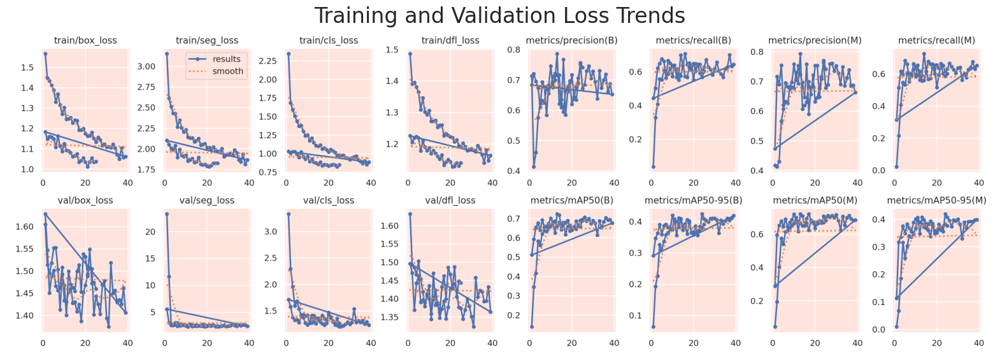

In [ ]:
# Define the path to the results file
results_file_path = os.path.join(post_training_files_path, 'results.png')

# Check if the file exists
if os.path.exists(results_file_path):
    # Read the image using OpenCV
    image = cv2.imread(results_file_path)

    # Check if the image is loaded correctly
    if image is not None:
        # Convert from BGR to RGB (OpenCV uses BGR by default)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # Display the image using Matplotlib
        plt.figure(figsize=(20, 8))
        plt.imshow(image)
        plt.title('Training and Validation Loss Trends', fontsize=24)
        plt.axis('off')  # Hide the axis
        plt.show()
    else:
        print(f"Failed to load image: {results_file_path}. The file may be corrupted.")
else:
    print(f"File not found: {results_file_path}")


In [ ]:
# Define a function to plot learning curves for loss values
def plot_learning_curve(df, train_loss_col, val_loss_col, title, ylim_range=[0,2]):
    plt.figure(figsize=(12, 4))
    sns.lineplot(data=df, x='epoch', y=train_loss_col, label='Train Loss', color='blue', linestyle='-', linewidth=2)
    sns.lineplot(data=df, x='epoch', y=val_loss_col, label='Validation Loss', color='#ed2f00', linestyle='--', linewidth=2)
    plt.title(title)
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.ylim(ylim_range)
    plt.legend()
    plt.show()

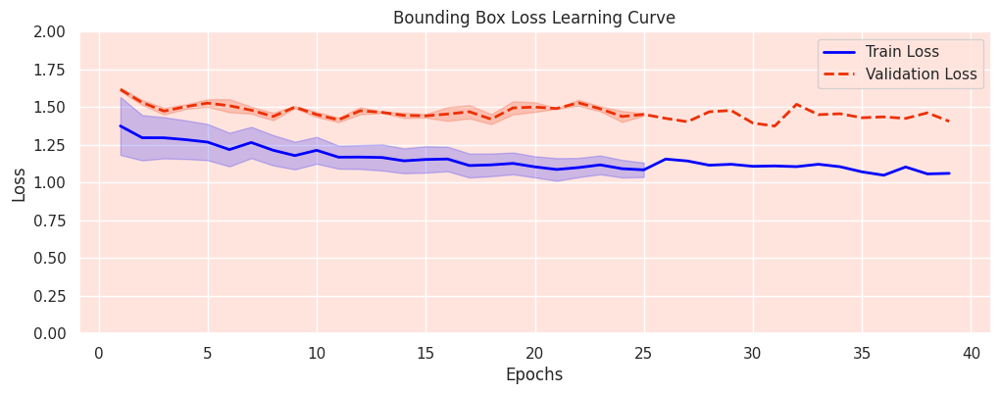

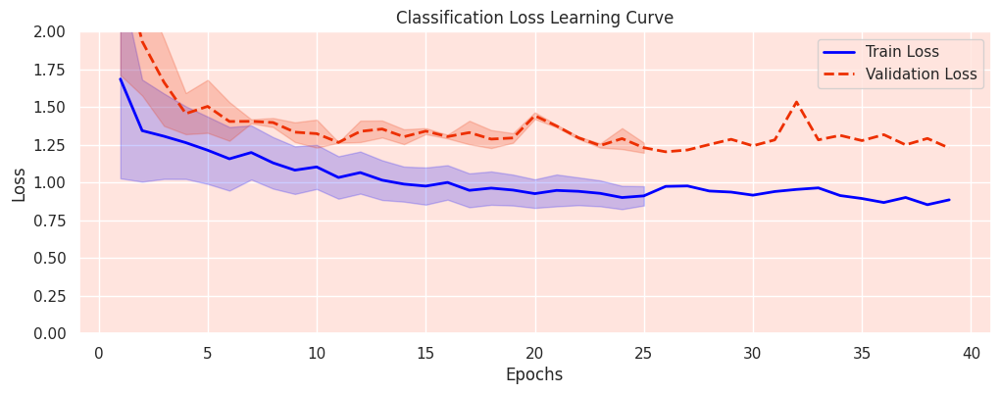

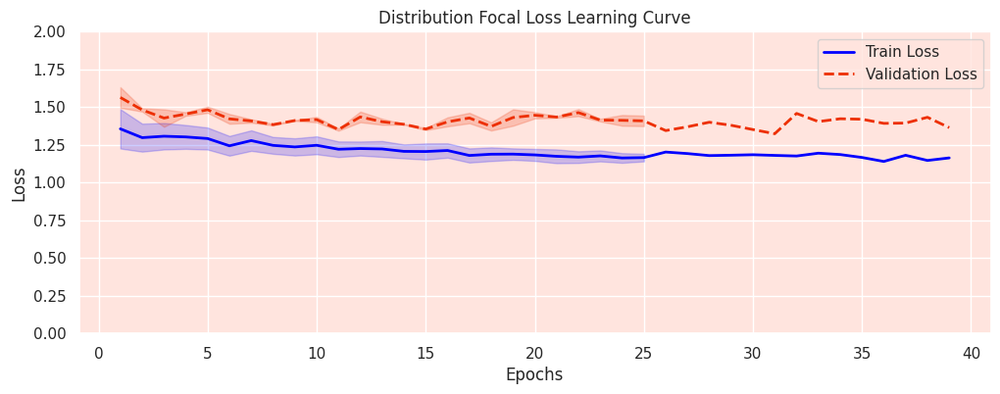

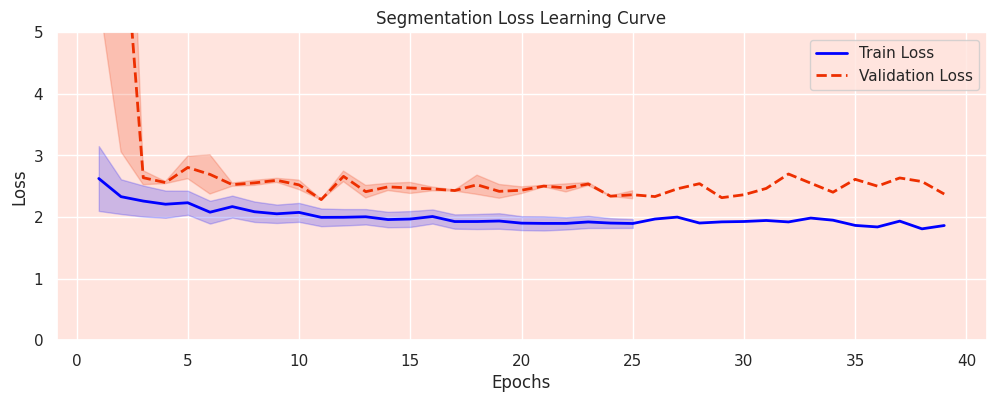

In [ ]:
# Create the full file path for 'results.csv' using the directory path and file name
results_csv_path = os.path.join(post_training_files_path, 'results.csv')

# Load the CSV file from the constructed path into a pandas DataFrame
df = pd.read_csv(results_csv_path)

# Remove any leading whitespace from the column names
df.columns = df.columns.str.strip()

# Plot the learning curves for each loss
plot_learning_curve(df, 'train/box_loss', 'val/box_loss', 'Bounding Box Loss Learning Curve')
plot_learning_curve(df, 'train/cls_loss', 'val/cls_loss', 'Classification Loss Learning Curve')
plot_learning_curve(df, 'train/dfl_loss', 'val/dfl_loss', 'Distribution Focal Loss Learning Curve')
plot_learning_curve(df, 'train/seg_loss', 'val/seg_loss', 'Segmentation Loss Learning Curve', ylim_range=[0,5])

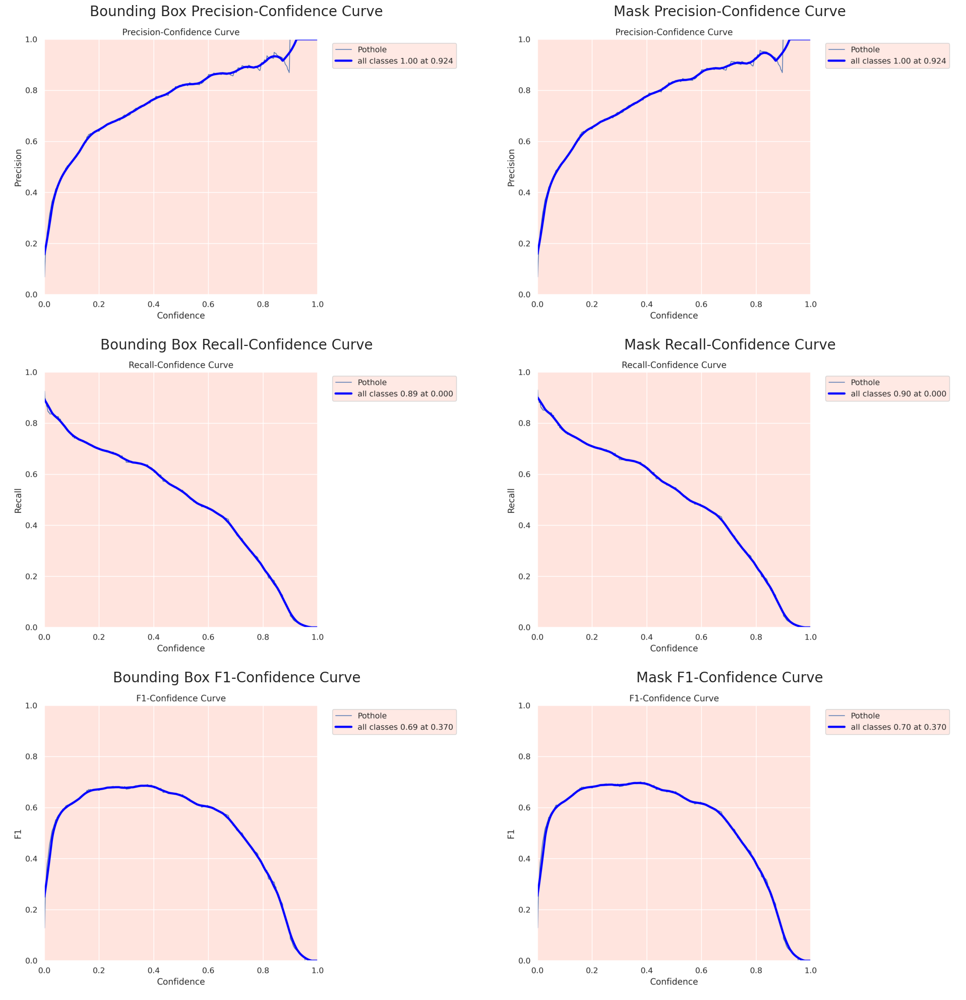

In [ ]:
# Define the filenames for 'Box' and 'Mask' metrics along with their titles
box_files_titles = {
    'BoxP_curve.png': 'Bounding Box Precision-Confidence Curve',
    'BoxR_curve.png': 'Bounding Box Recall-Confidence Curve',
    'BoxF1_curve.png': 'Bounding Box F1-Confidence Curve'
}
mask_files_titles = {
    'MaskP_curve.png': 'Mask Precision-Confidence Curve',
    'MaskR_curve.png': 'Mask Recall-Confidence Curve',
    'MaskF1_curve.png': 'Mask F1-Confidence Curve'
}

# Create a 3x2 subplot
fig, axs = plt.subplots(3, 2, figsize=(20, 20))

# Function to read and convert image for plotting
def read_and_convert_image(file_path):
    if os.path.exists(file_path):
        # Read the image using cv2
        image = cv2.imread(file_path)
        # Convert from BGR to RGB
        return cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    else:
        return None

# Plot 'Box' images in the first column with meaningful titles
for i, (filename, title) in enumerate(box_files_titles.items()):
    img_path = os.path.join(post_training_files_path, filename)
    img = read_and_convert_image(img_path)
    if img is not None:
        axs[i, 0].imshow(img)
    else:
        axs[i, 0].text(0.5, 0.5, "Image not found", ha='center', va='center', fontsize=16)
    axs[i, 0].set_title(title, fontsize=20)
    axs[i, 0].axis('off')

# Plot 'Mask' images in the second column with meaningful titles
for i, (filename, title) in enumerate(mask_files_titles.items()):
    img_path = os.path.join(post_training_files_path, filename)
    img = read_and_convert_image(img_path)
    if img is not None:
        axs[i, 1].imshow(img)
    else:
        axs[i, 1].text(0.5, 0.5, "Image not found", ha='center', va='center', fontsize=16)
    axs[i, 1].set_title(title, fontsize=20)
    axs[i, 1].axis('off')

plt.tight_layout()
plt.show()


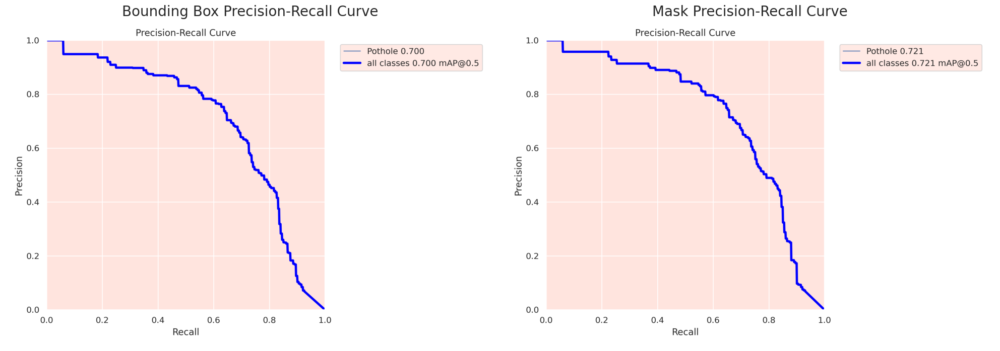

In [ ]:
# Define the filenames for 'Box' and 'Mask' metrics along with their titles
pr_files_titles = {
    'BoxPR_curve.png': 'Bounding Box Precision-Recall Curve',
    'MaskPR_curve.png': 'Mask Precision-Recall Curve'
}

# Create a 1x2 subplot
fig, axs = plt.subplots(1, 2, figsize=(20, 10))

# Function to read and convert image for plotting
def read_and_convert_image(file_path):
    if os.path.exists(file_path):
        # Read the image using cv2
        image = cv2.imread(file_path)
        # Convert from BGR to RGB
        return cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    else:
        return None

# Plot 'Box' and 'Mask' images in the subplot with meaningful titles
for i, (filename, title) in enumerate(pr_files_titles.items()):
    img_path = os.path.join(post_training_files_path, filename)
    img = read_and_convert_image(img_path)
    if img is not None:
        axs[i].imshow(img)
    else:
        axs[i].text(0.5, 0.5, "Image not found", ha='center', va='center', fontsize=16)
    axs[i].set_title(title, fontsize=20)
    axs[i].axis('off')

plt.tight_layout()
plt.show()


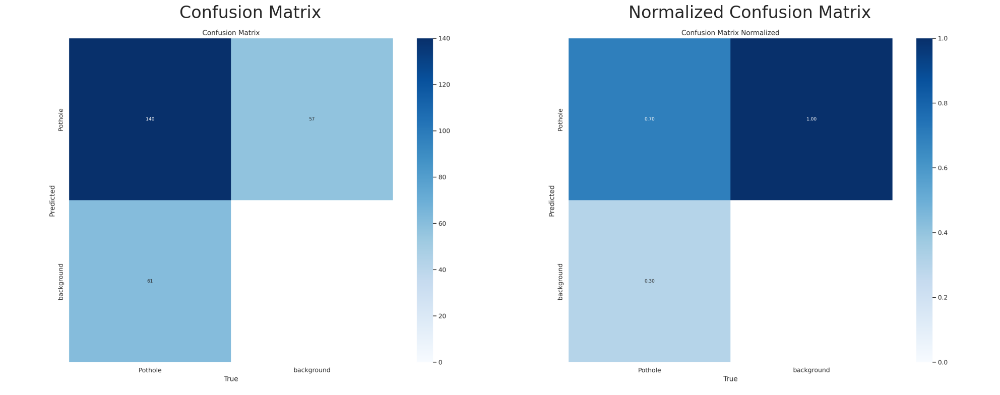

In [ ]:
# Construct the path to the confusion matrix images
confusion_matrix_path = os.path.join(post_training_files_path, 'confusion_matrix.png')
confusion_matrix_normalized_path = os.path.join(post_training_files_path, 'confusion_matrix_normalized.png')

# Create a 1x2 subplot
fig, axs = plt.subplots(1, 2, figsize=(20, 10))

# Function to read and convert image for plotting
def read_and_convert_image(file_path):
    if os.path.exists(file_path):
        # Read the image using cv2
        image = cv2.imread(file_path)
        # Convert from BGR to RGB
        return cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    else:
        return None

# Read and convert both images
cm_img = read_and_convert_image(confusion_matrix_path)
cm_norm_img = read_and_convert_image(confusion_matrix_normalized_path)

# Display the images with placeholder text if the image is not found
if cm_img is not None:
    axs[0].imshow(cm_img)
    axs[0].set_title('Confusion Matrix', fontsize=24)
else:
    axs[0].text(0.5, 0.5, "Image not found", ha='center', va='center', fontsize=16)
axs[0].axis('off')

if cm_norm_img is not None:
    axs[1].imshow(cm_norm_img)
    axs[1].set_title('Normalized Confusion Matrix', fontsize=24)
else:
    axs[1].text(0.5, 0.5, "Image not found", ha='center', va='center', fontsize=16)
axs[1].axis('off')

plt.tight_layout()
plt.show()


In [ ]:
# Construct the path to the best model weights file
best_model_path = os.path.join(post_training_files_path, 'weights/best.pt')

# Check if the model file exists before attempting to load it
if os.path.exists(best_model_path):
    # Load the best model weights into the YOLO model
    best_model = YOLO(best_model_path)
    print(f"Successfully loaded the model from {best_model_path}")

    # Validate the best model using the validation set with default parameters
    metrics = best_model.val(split='val')
    print("Validation metrics:", metrics)
else:
    print(f"Model file not found at {best_model_path}. Please check the path.")


Successfully loaded the model from /content/drive/MyDrive/pothole_model/logs/pothole_segmentation_training/weights/best.pt
Ultralytics 8.3.36 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8n-seg summary (fused): 195 layers, 3,258,259 parameters, 0 gradients, 12.0 GFLOPs


val: Scanning /content/drive/MyDrive/Colab Notebooks/Pothole by Yash/valid/labels.cache... 60 images, 0 backgrounds, 0 corrupt: 100%|██████████| 60/60 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:05<00:00,  1.27s/it]


                   all         60        201      0.744      0.637      0.699      0.417      0.751      0.642      0.708      0.394
Speed: 0.6ms preprocess, 24.9ms inference, 0.0ms loss, 4.3ms postprocess per image
Results saved to runs/segment/val
Validation metrics: ultralytics.utils.metrics.SegmentMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7d4fbe4cf0d0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)', 'Precision-Recall(M)', 'F1-Confidence(M)', 'Precision-Confidence(M)', 'Recall-Confidence(M)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.02102

In [ ]:
# Convert the dictionary to a pandas DataFrame
metrics_df = pd.DataFrame.from_dict(metrics.results_dict, orient='index', columns=['Metric Value'])

# Round the metric values for better readability
metrics_df_rounded = metrics_df.round(3)

# Display the DataFrame with a header for clarity
print("Model Evaluation Metrics:")
print(metrics_df_rounded)


Model Evaluation Metrics:
                      Metric Value
metrics/precision(B)         0.744
metrics/recall(B)            0.637
metrics/mAP50(B)             0.699
metrics/mAP50-95(B)          0.417
metrics/precision(M)         0.751
metrics/recall(M)            0.642
metrics/mAP50(M)             0.708
metrics/mAP50-95(M)          0.394
fitness                      0.871


**Step 6 | Model Inference**

In [ ]:

# Define the path to the validation images
valid_images_path = os.path.join(dataset_path, 'valid', 'images')

# List all jpg images in the directory
image_files = [file for file in os.listdir(valid_images_path) if file.endswith('.jpg')]

# Ensure at least 9 images are selected, or adjust accordingly
num_images = len(image_files)
selected_images = [image_files[i] for i in range(0, num_images, max(1, num_images // 9))]

# Initialize the subplot (3x3 for 9 images)
fig, axes = plt.subplots(3, 3, figsize=(20, 21))
fig.suptitle('Validation Set Inferences', fontsize=24)

# Initialize the model
best_model = YOLO('/content/drive/MyDrive/Colab Notebooks/Pothole by Yash/best_model.pt')

# Perform inference on each selected image and display it
for i, ax in enumerate(axes.flatten()):
    if i >= len(selected_images):  # If fewer than 9 images are selected
        break
    image_path = os.path.join(valid_images_path, selected_images[i])

    try:
        # Perform inference
        results = best_model.predict(source=image_path, imgsz=640)
        annotated_image = results[0].plot()  # Plot the annotations on the image
        annotated_image_rgb = cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB)

        # Display the image
        ax.imshow(annotated_image_rgb)
        ax.axis('off')
    except Exception as e:
        print(f"Error processing {image_path}: {e}")
        ax.set_title(f"Error in {selected_images[i]}")

# Tight layout to ensure images fit
plt.tight_layout()
plt.show()


In [ ]:
# Export the YOLO model to ONNX format
onnx_model_path = '/content/drive/MyDrive/pothole_model/best_model.onnx'

# Export the model
best_model.export(format='onnx', path=onnx_model_path)

# Print the path where the ONNX model is saved
print(f"Model successfully exported to: {onnx_model_path}")


In [ ]:
from ultralytics import YOLO

# Load the trained model
model_path = "/content/drive/MyDrive/Colab Notebooks/Pothole by Yash/best_model.pt"
model = YOLO(model_path)



image 1/1 /content/drive/MyDrive/Colab Notebooks/Pothole by Yash/valid/images/pic-263-_jpg.rf.47073e3fbc426b15c3caa7e8daa66719.jpg: 640x640 2 Potholes, 15.4ms
Speed: 2.0ms preprocess, 15.4ms inference, 3.6ms postprocess per image at shape (1, 3, 640, 640)


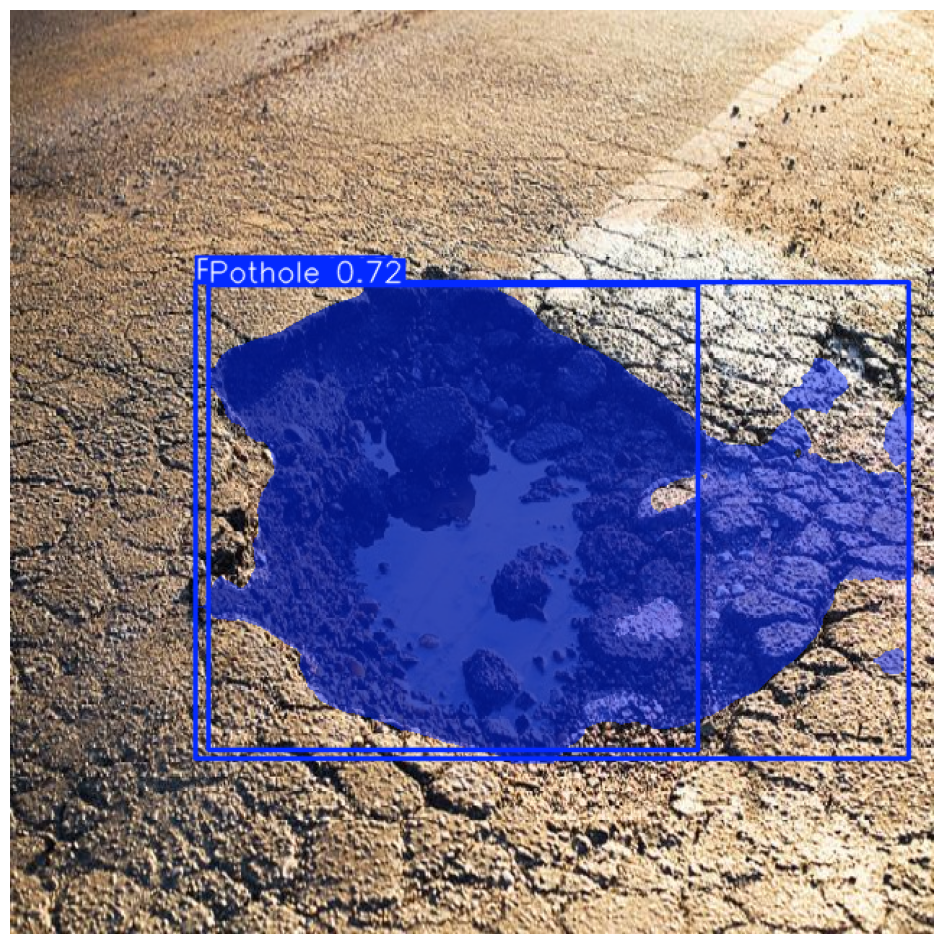

In [ ]:
# Step 1: Load the input image
image_path = '/content/drive/MyDrive/Colab Notebooks/Pothole by Yash/valid/images/pic-263-_jpg.rf.47073e3fbc426b15c3caa7e8daa66719.jpg'  # Replace with your image path
image = cv2.imread(image_path)  # Read image using OpenCV
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert image from BGR to RGB

# Step 2: Run the inference (prediction) on the image
results = model.predict(source=image_path, imgsz=640)  # Perform inference on the image

# Step 3: Visualize the predictions
# Get the annotated image (with bounding boxes, masks, and labels)
annotated_image = results[0].plot()  # results[0] contains the predicted annotations

# Convert the annotated image to RGB for displaying with matplotlib
annotated_image_rgb = cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB)

# Step 4: Display the image with predictions using matplotlib
plt.figure(figsize=(12, 12))
plt.imshow(annotated_image_rgb)
plt.axis('off')  # Hide the axis
plt.show()



image 1/1 /content/drive/MyDrive/Colab Notebooks/Pothole by Yash/valid/images/pic-230-_jpg.rf.ffe557c4b95e23f1a4323cf7768060f2.jpg: 640x640 3 Potholes, 17.8ms
Speed: 2.5ms preprocess, 17.8ms inference, 4.0ms postprocess per image at shape (1, 3, 640, 640)


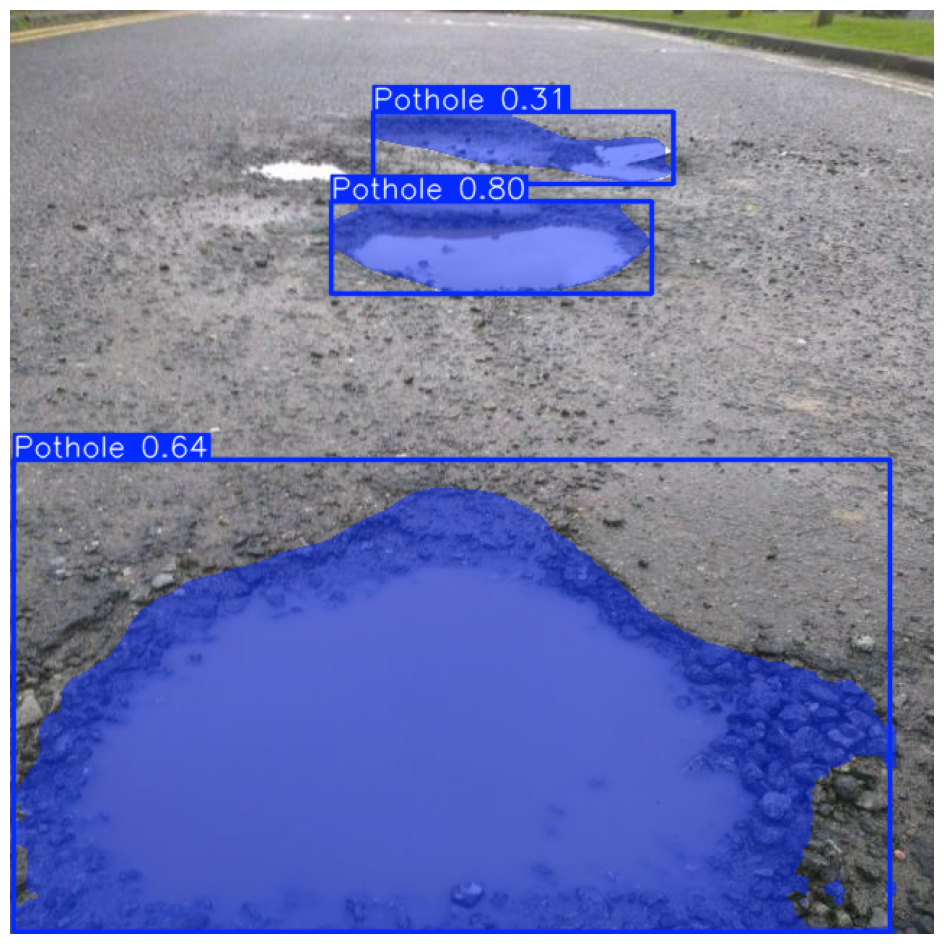

In [ ]:
# Step 1: Load the input image
image_path = '/content/drive/MyDrive/Colab Notebooks/Pothole by Yash/valid/images/pic-230-_jpg.rf.ffe557c4b95e23f1a4323cf7768060f2.jpg'  # Replace with your image path
image = cv2.imread(image_path)  # Read image using OpenCV
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert image from BGR to RGB

# Step 2: Run the inference (prediction) on the image
results = model.predict(source=image_path, imgsz=640)  # Perform inference on the image

# Step 3: Visualize the predictions
# Get the annotated image (with bounding boxes, masks, and labels)
annotated_image = results[0].plot()  # results[0] contains the predicted annotations

# Convert the annotated image to RGB for displaying with matplotlib
annotated_image_rgb = cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB)

# Step 4: Display the image with predictions using matplotlib
plt.figure(figsize=(12, 12))
plt.imshow(annotated_image_rgb)
plt.axis('off')  # Hide the axis
plt.show()


In [ ]:
import cv2

# Path to input and output video
input_video_path = '/content/drive/MyDrive/Colab Notebooks/Pothole by Yash/sample_video.mp4'
output_video_path = '/content/drive/MyDrive/Colab Notebooks/Pothole by Yash/processed_video.mp4'

# Open the input video
cap = cv2.VideoCapture(input_video_path)

# Get video properties
fps = cap.get(cv2.CAP_PROP_FPS)
frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

# Initialize the video writer to save the processed video
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
out = cv2.VideoWriter(output_video_path, fourcc, fps, (frame_width, frame_height))

# Process the video frame by frame
while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    # Run inference on the current frame
    results = model(frame)

    # Annotate the frame with detected results
    annotated_frame = results[0].plot()

    # Write the annotated frame to the output video
    out.write(annotated_frame)

# Release resources
cap.release()
out.release()
cv2.destroyAllWindows()

# Indicate that video processing is complete
print("Video processing complete. The output video is saved at:", output_video_path)



0: 384x640 (no detections), 12.4ms
Speed: 4.0ms preprocess, 12.4ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 Pothole, 14.6ms
Speed: 2.7ms preprocess, 14.6ms inference, 4.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 14.5ms
Speed: 2.0ms preprocess, 14.5ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 Pothole, 13.6ms
Speed: 2.0ms preprocess, 13.6ms inference, 3.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 Pothole, 13.3ms
Speed: 2.0ms preprocess, 13.3ms inference, 3.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 Pothole, 12.8ms
Speed: 2.0ms preprocess, 12.8ms inference, 3.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 Pothole, 12.1ms
Speed: 2.0ms preprocess, 12.1ms inference, 3.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 Pothole, 12.9ms
Speed: 2.1ms preprocess, 12.9ms inference, 3.0ms postprocess per imag

In [ ]:
import cv2
import matplotlib.pyplot as plt
from IPython.display import Video

# Path to input and output video
input_video_path = '/content/drive/MyDrive/Colab Notebooks/Pothole by Yash/sample_video.mp4'
output_video_path = '/content/drive/MyDrive/Colab Notebooks/Pothole by Yash/processed_video_2.mp4'

# Open the input video
cap = cv2.VideoCapture(input_video_path)

# Get video properties
fps = cap.get(cv2.CAP_PROP_FPS)
frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

# Initialize the video writer to save the processed video
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
out = cv2.VideoWriter(output_video_path, fourcc, fps, (frame_width, frame_height))

# Process the video frame by frame
while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    # Convert frame from BGR to RGB (YOLOv8 expects RGB format)
    frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

    # Run inference on the current frame
    results = model(frame_rgb, conf=0.25)  # Set confidence threshold to 25%

    # Annotate the frame with detected results
    annotated_frame = results[0].plot()

    # Convert annotated frame back to BGR for saving as a video
    annotated_frame_bgr = cv2.cvtColor(annotated_frame, cv2.COLOR_RGB2BGR)

    # Write the annotated frame to the output video
    out.write(annotated_frame_bgr)

# Release resources
cap.release()
out.release()
cv2.destroyAllWindows()

# Indicate that video processing is complete
print("Video processing complete. The output video is saved at:", output_video_path)



0: 384x640 2 Potholes, 24.3ms
Speed: 2.2ms preprocess, 24.3ms inference, 5.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 Potholes, 12.4ms
Speed: 3.3ms preprocess, 12.4ms inference, 3.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 Potholes, 13.6ms
Speed: 2.7ms preprocess, 13.6ms inference, 4.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 Potholes, 13.2ms
Speed: 2.1ms preprocess, 13.2ms inference, 4.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 Potholes, 14.9ms
Speed: 3.5ms preprocess, 14.9ms inference, 4.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 Potholes, 14.4ms
Speed: 2.0ms preprocess, 14.4ms inference, 4.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 Potholes, 12.5ms
Speed: 1.9ms preprocess, 12.5ms inference, 4.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 Potholes, 14.3ms
Speed: 2.7ms preprocess, 14.3ms inference, 4.3ms postprocess per image at

In [ ]:
import cv2
import matplotlib.pyplot as plt
from IPython.display import Video

# Path to input and output video
input_video_path = '/content/drive/MyDrive/Colab Notebooks/Pothole by Yash/sample_video_2.mp4'
output_video_path = '/content/drive/MyDrive/Colab Notebooks/Pothole by Yash/processed_video_of_2.mp4'

# Open the input video
cap = cv2.VideoCapture(input_video_path)

# Get video properties
fps = cap.get(cv2.CAP_PROP_FPS)
frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

# Initialize the video writer to save the processed video
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
out = cv2.VideoWriter(output_video_path, fourcc, fps, (frame_width, frame_height))

# Process the video frame by frame
while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    # Convert frame from BGR to RGB (YOLOv8 expects RGB format)
    frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

    # Run inference on the current frame
    results = model(frame_rgb, conf=0.25)  # Set confidence threshold to 25%

    # Annotate the frame with detected results
    annotated_frame = results[0].plot()

    # Convert annotated frame back to BGR for saving as a video
    annotated_frame_bgr = cv2.cvtColor(annotated_frame, cv2.COLOR_RGB2BGR)

    # Write the annotated frame to the output video
    out.write(annotated_frame_bgr)

# Release resources
cap.release()
out.release()
cv2.destroyAllWindows()

# Indicate that video processing is complete
print("Video processing complete. The output video is saved at:", output_video_path)



In [ ]:
from IPython.display import Video

# Display the processed video in Colab with embedding enabled
Video('/content/drive/MyDrive/Colab Notebooks/Pothole by Yash/processed_video.mp4', embed=True, width=640, height=480)
